In [6]:
import os
import shutil

# 原始ESD路径
esd_root = "/home/you/workspace/database/ESD"
# 输出目录
target_root = "/home/you/workspace/son/FastSpeech2/raw_data/ESD"

os.makedirs(target_root, exist_ok=True)

# 遍历所有说话人（0001~0020）
for speaker_id in sorted(os.listdir(esd_root)):
    speaker_path = os.path.join(esd_root, speaker_id)
    if not os.path.isdir(speaker_path):
        continue

    # 读取文本文件
    txt_path = os.path.join(speaker_path, f"{speaker_id}.txt")
    if not os.path.isfile(txt_path):
        print(f"跳过缺失文本文件: {txt_path}")
        continue

    with open(txt_path, "r", encoding="utf-8") as f:
        lines = f.readlines()

    for line in lines:
        # 处理行，分离 utt_id, text, emotion
        if "\t" in line:
            utt_info, text, emotion = line.strip().split("\t")
        else:
            utt_info, text, emotion = line.strip().rsplit("    ", 1)
        parts = utt_info.strip().split('_')
        speaker, utt_id = parts

        # 构造文件名
        wav_name = f"{utt_info}.wav"
        wav_src_path = os.path.join(speaker_path, emotion, wav_name)

        if not os.path.isfile(wav_src_path):
            print(f"音频缺失: {wav_src_path}")
            continue

        speaker_out_dir = os.path.join(target_root, speaker_id)
        os.makedirs(speaker_out_dir, exist_ok=True)

        tgt_name = f"{speaker_id}_{emotion}_{utt_id}.wav"
        wav_dst_path = os.path.join(speaker_out_dir, tgt_name)
        lab_dst_path = wav_dst_path.replace(".wav", ".lab")

        shutil.copyfile(wav_src_path, wav_dst_path)
        with open(lab_dst_path, "w", encoding="utf-8") as f:
            f.write(text.strip())

print("ESD 数据整理完成！")


ESD 数据整理完成！


In [2]:
'''生成带所有信息的train.txt'''
import os
import torch
import types
import librosa
import torch.nn as nn
from tqdm import tqdm
from transformers import AutoModelForAudioClassification
from transformers.models.wav2vec2.modeling_wav2vec2 import (
    Wav2Vec2Model, Wav2Vec2PreTrainedModel
)

# === AVD Encoder Definitions ===

class ADV(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.dense = nn.Linear(config.hidden_size, config.hidden_size)
        self.out_proj = nn.Linear(config.hidden_size, config.num_labels)

    def forward(self, x):
        x = self.dense(x)
        x = torch.tanh(x)
        return self.out_proj(x)

class Dawn(Wav2Vec2PreTrainedModel):
    def __init__(self, config):
        super().__init__(config)
        self.wav2vec2 = Wav2Vec2Model(config)
        self.classifier = ADV(config)

    def forward(self, x):
        x -= x.mean(1, keepdim=True)
        variance = (x * x).mean(1, keepdim=True) + 1e-7
        x = self.wav2vec2(x / variance.sqrt())
        return self.classifier(x.last_hidden_state.mean(1))

def _forward(self, x):
    x = (x + self.config.mean) / self.config.std
    x = self.ssl_model(x, attention_mask=None).last_hidden_state
    h = self.pool_model.sap_linear(x).tanh()
    w = torch.matmul(h, self.pool_model.attention).softmax(1)
    mu = (x * w).sum(1)
    x = torch.cat([mu, ((x * x * w).sum(1) - mu * mu).clamp(min=1e-7).sqrt()], 1)
    return self.ser_model(x)

# === Coordinate Conversion ===

@torch.no_grad()
def avd_to_spherical_raw(avd: torch.Tensor, M: torch.Tensor, eps=1e-8):
    avd_shifted = avd - M  # [B, 3]
    r_raw = torch.norm(avd_shifted, dim=1)
    # IQR 归一化
    q1 = r_raw.quantile(0.25)
    q3 = r_raw.quantile(0.75)
    iqr = q3 - q1
    r_min = q1 - 1.5 * iqr
    r_max = q3 + 1.5 * iqr
    r_norm = ((r_raw - r_min) / (r_max - r_min + eps)).clamp(0, 1)
    a_p, v_p, d_p = avd_shifted[:, 0], avd_shifted[:, 1], avd_shifted[:, 2]
    theta = torch.acos(torch.clamp(d_p / (r_raw + eps), -1 + eps, 1 - eps))  # θ: [0, π]
    phi = torch.atan2(v_p, a_p)  # φ: [-π, π]
    return r_raw, r_norm, theta, phi

# === Main Processing ===

def process_txt(input_txt, output_txt, wav_root):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    base = AutoModelForAudioClassification.from_pretrained(
        '3loi/SER-Odyssey-Baseline-WavLM-Multi-Attributes',
        trust_remote_code=True).to(device).eval()
    base.forward = types.MethodType(_forward, base)

    dawn = Dawn.from_pretrained(
        'audeering/wav2vec2-large-robust-12-ft-emotion-msp-dim'
    ).to(device).eval()

    def wav2small(x):
        return 0.5 * dawn(x) + 0.5 * base(x)

    avd_list, is_neutral_list, line_list, emotion_list = [], [], [], []

    with open(input_txt, "r") as fin:
        for line in tqdm(fin):
            parts = line.strip().split("|")
            utt_id = parts[0]
            speaker = parts[1]
            emotion_tag = utt_id.split("_")[1]
            is_neutral = "Neutral" in emotion_tag
            wav_path = os.path.join(wav_root, speaker, utt_id + ".wav")

            if not os.path.exists(wav_path):
                print(f"[WARN] Missing: {wav_path}")
                continue

            signal = torch.from_numpy(librosa.load(wav_path, sr=16000)[0])[None, :]
            pred = wav2small(signal.to(device)).cpu()
            a, v, d = pred[0, 0], pred[0, 2], pred[0, 1]

            emotion_list.append(emotion_tag)
            avd_list.append([a.item(), v.item(), d.item()])
            is_neutral_list.append(is_neutral)
            line_list.append(line.strip())

    avd_tensor = torch.tensor(avd_list)  # [B, 3]
    neutral_mask = torch.tensor(is_neutral_list)

    M = avd_tensor[neutral_mask].mean(dim=0, keepdim=True)  # 中性中心

    r_raws, r_norms, thetas, phis = avd_to_spherical_raw(avd_tensor, M)

    with open(output_txt, "w") as fout:
        for line, emotion, (a, v, d), r_norm, theta, phi in zip(line_list, emotion_list, avd_tensor, r_norms, thetas, phis):
            fout.write(f"{line}|{emotion}|{a:.6f}|{v:.6f}|{d:.6f}|{r_norm.item():.6f}|{theta.item():.6f}|{phi.item():.6f}\n")


# === Entry Point ===

if __name__ == "__main__":
    input_path = "/home/you/workspace/son/FastSpeech2/preprocessed_data/ESD/train_original.txt"
    output_path = "/home/you/workspace/son/FastSpeech2/preprocessed_data/ESD/train_emosphere.txt"
    wav_root = "/home/you/workspace/son/FastSpeech2/raw_data/ESD/"

    process_txt(input_path, output_path, wav_root)

    input_path = "/home/you/workspace/son/FastSpeech2/preprocessed_data/ESD/val_original.txt"
    output_path = "/home/you/workspace/son/FastSpeech2/preprocessed_data/ESD/val_emosphere.txt"

    process_txt(input_path, output_path, wav_root)


Explicitly passing a `revision` is encouraged when loading a configuration with custom code to ensure no malicious code has been contributed in a newer revision.
Explicitly passing a `revision` is encouraged when loading a model with custom code to ensure no malicious code has been contributed in a newer revision.
16987it [09:46, 28.96it/s]
Explicitly passing a `revision` is encouraged when loading a configuration with custom code to ensure no malicious code has been contributed in a newer revision.
Explicitly passing a `revision` is encouraged when loading a model with custom code to ensure no malicious code has been contributed in a newer revision.
512it [00:17, 29.13it/s]


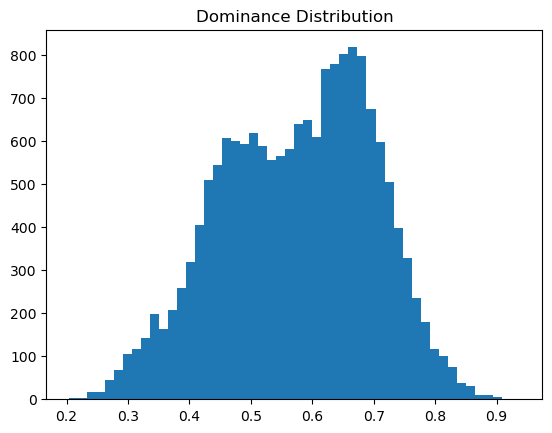

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from sklearn.preprocessing import LabelEncoder

import pandas as pd

df = pd.read_csv("/home/you/workspace/son/FastSpeech2/preprocessed_data/ESD/train.txt", sep="|", header=None)
emotions = df[4].values
dominance = df[7].astype(float).values
r = df[8].astype(float).values
theta = df[9].astype(float).values
phi = df[10].astype(float).values

plt.hist(dominance, bins=50)
plt.title("Dominance Distribution")
plt.show()



# # 球坐标 → 笛卡尔坐标
# x = r * np.sin(theta) * np.cos(phi)
# y = r * np.sin(theta) * np.sin(phi)
# z = r * np.cos(theta)

# # 情绪类别编码为颜色
# le = LabelEncoder()
# labels = le.fit_transform(emotions)
# cmap = cm.get_cmap('tab10', len(le.classes_))

# # 可视化
# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(111, projection='3d')
# sc = ax.scatter(x, y, z, c=labels, cmap=cmap, s=60, alpha=0.9)

# # 添加球面网格（单位球）
# u = np.linspace(0, 2 * np.pi, 100)
# v = np.linspace(0, np.pi, 100)
# xs = np.outer(np.cos(u), np.sin(v))
# ys = np.outer(np.sin(u), np.sin(v))
# zs = np.outer(np.ones_like(u), np.cos(v))
# ax.plot_surface(xs, ys, zs, color='lightgray', alpha=0.1, linewidth=0)

# # 添加图例
# handles = [plt.Line2D([], [], marker='o', linestyle='', color=cmap(i), label=le.classes_[i]) for i in range(len(le.classes_))]
# ax.legend(handles=handles, loc='upper left')

# ax.set_title("3D Emotion Distribution in Spherical Space")
# ax.set_xlabel("X")
# ax.set_ylabel("Y")
# ax.set_zlabel("Z")
# plt.tight_layout()
# plt.show()


In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# ====== 1. 加载数据 ======
df = pd.read_csv("/home/you/workspace/son/FastSpeech2/preprocessed_data/ESD/train.txt", sep="|", header=None,
                 names=["utt_id", "speaker", "phoneme", "text", "emotion", "a", "v", "d", "r", "theta", "phi"])

df["r"] = df["r"].astype(float)
df["theta"] = df["theta"].astype(float)
df["phi"] = df["phi"].astype(float)

# ====== 2. 球坐标 → 笛卡尔坐标 ======
df["x"] = df["r"] * np.sin(df["theta"]) * np.cos(df["phi"])
df["y"] = df["r"] * np.sin(df["theta"]) * np.sin(df["phi"])
df["z"] = df["r"] * np.cos(df["theta"])

# ====== 3. 使用 Plotly Express 创建散点图（但不直接用 fig）=====
px_fig = px.scatter_3d(
    df,
    x="x", y="y", z="z",
    color="emotion",
    hover_data=["text", "r", "theta", "phi"],
    opacity=0.8,
    symbol="emotion"
)

# ====== 4. 创建单位球面 (Surface) ======
theta = np.linspace(0, np.pi, 60)
phi = np.linspace(0, 2 * np.pi, 60)
theta, phi = np.meshgrid(theta, phi)
x_sphere = np.sin(theta) * np.cos(phi)
y_sphere = np.sin(theta) * np.sin(phi)
z_sphere = np.cos(theta)

sphere = go.Surface(
    x=x_sphere,
    y=y_sphere,
    z=z_sphere,
    opacity=0.2,
    showscale=False,
    colorscale=[[0, 'lightgray'], [1, 'lightgray']],
    hoverinfo='skip',
    hovertemplate=None,
    name='',
    showlegend=False,
    lighting=dict(ambient=0),
    surfacecolor=np.zeros_like(z_sphere),
)

# ====== 5. 合并：取 px_fig 中的 traces 加入 go.Figure ======
fig = go.Figure()

# 添加单位球面
fig.add_trace(sphere)

# 添加散点图 trace
for trace in px_fig.data:
    fig.add_trace(trace)

# ====== 6. 设置布局 ======
# 设置散点大小（排除 Surface）
for trace in fig.data:
    if isinstance(trace, go.Scatter3d):
        trace.marker.size = 2

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    title="3D Emotion Distribution with Reference Sphere",
    margin=dict(l=0, r=0, b=0, t=50)
)

# 展示与导出
fig.show()
fig.write_html("ESD_train.html")


In [15]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# ====== 1. 加载数据 ======
df = pd.read_csv("/home/you/workspace/son/FastSpeech2/preprocessed_data/MSP_clean_new/train.txt", sep="|", header=None,
                 names=["utt_id", "speaker", "phoneme", "text", "emotion", "a", "v", "d", "r", "theta", "phi"])

df["r"] = df["r"].astype(float)
df["theta"] = df["theta"].astype(float)
df["phi"] = df["phi"].astype(float)

# ====== 2. 球坐标 → 笛卡尔坐标 ======
df["x"] = df["r"] * np.sin(df["theta"]) * np.cos(df["phi"])
df["y"] = df["r"] * np.sin(df["theta"]) * np.sin(df["phi"])
df["z"] = df["r"] * np.cos(df["theta"])

# ====== 3. 使用 Plotly Express 创建散点图（但不直接用 fig）=====
px_fig = px.scatter_3d(
    df,
    x="x", y="y", z="z",
    color="emotion",
    hover_data=["text", "r", "theta", "phi"],
    opacity=0.8,
    symbol="emotion"
)

# ====== 4. 创建单位球面 (Surface) ======
# 单位球线框数
n_theta = 12   # 纬线数
n_phi = 12     # 经线数
R = 1.0        # 球半径

wire_traces = []

# 纬度线（固定 theta，绕 φ 转一圈）
theta_vals = np.linspace(0.1, np.pi - 0.1, n_theta)  # 避免极点堆叠
phi = np.linspace(0, 2 * np.pi, 100)

for theta in theta_vals:
    x = R * np.sin(theta) * np.cos(phi)
    y = R * np.sin(theta) * np.sin(phi)
    z = R * np.cos(theta) * np.ones_like(phi)
    wire_traces.append(go.Scatter3d(
        x=x, y=y, z=z,
        mode='lines',
        line=dict(color='gray', width=2),
        hoverinfo='skip',
        showlegend=False
    ))

# 经度线（固定 phi，从极到极走 θ）
phi_vals = np.linspace(0, 2 * np.pi, n_phi)
theta = np.linspace(0, np.pi, 100)

for phi in phi_vals:
    x = R * np.sin(theta) * np.cos(phi)
    y = R * np.sin(theta) * np.sin(phi)
    z = R * np.cos(theta)
    wire_traces.append(go.Scatter3d(
        x=x, y=y, z=z,
        mode='lines',
        line=dict(color='gray', width=2),
        hoverinfo='skip',
        showlegend=False
    ))


# ====== 5. 合并：取 px_fig 中的 traces 加入 go.Figure ======
fig = go.Figure()

for trace in px_fig.data:
    trace.showlegend = False
    fig.add_trace(trace)

for wire in wire_traces:
    fig.add_trace(wire)

# 添加 legend 专用虚拟 trace
emotions = df["emotion"].unique()

for i, emo in enumerate(emotions):
    fig.add_trace(go.Scatter3d(
        x=[None], y=[None], z=[None],
        mode='markers',
        marker=dict(size=10, color=px.colors.qualitative.Plotly[i], opacity=1.0),
        name=emo,
        showlegend=True,
        visible='legendonly' 
    ))

# 设置真实散点图点大小
for trace in fig.data:
    if isinstance(trace, go.Scatter3d) and trace.x[0] is not None:
        trace.marker.size = 2

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    title="3D Emotion Distribution with Sphere",
    margin=dict(l=0, r=0, b=0, t=50)
)

# 展示与导出
fig.show()
fig.write_html("MSP_train.html")
